Ryan Pindale

PHYS165

Final Project: Analyzing Piano Recordings Using FFTs


My code requires the following modules:
pyaudio,
wave,
time,
display

(I think that those are the only ones you need. I installed a lot of different modules trying to mess with some of the display stuff. If you get errors, you can message me!)

It also requires adjusting the notebook settings. I just put the following the terminal:
jupyter notebook --NotebookApp.iopub_data_rate_limit=1e10




The goal of this project is to use FFT to determine the notes that are played by a piano in recordings pulled from the internet. Three mp3 files were found and converted into wav files. Several modules were installed to be able to run the program. The first audio file is a very clean C-major scale with no noticeable noise and no chords. The second audio file is a recording with some significant noise. The recording is three distinct notes followed by a chord made up of those three notes. The last audio file is a C-major scale with chords. There are actually two octaves that alternate in the scale. 

Part one:
1.	Read in the audio file of the first C-major scale  
2.	Use FFT to find the frequency of the notes.  
3.	Use the frequencies found in objective 2 to create a new audio file of the scale.  
4.	Play the new audio file from objective 3 and the original audio file to see if there is a noticeable  difference in sound.  
5.	Look up the frequencies of the notes in a C-major scale and use them to create another audio file.  
6.	Play the audio file from objective 5 and objective 3 to see if the piano was decently tuned.  

Part two:
1.	Read in the audio file of the triad construction.  
2.	Use FFT to find the frequency of the notes and the noise.  
3.	Identify the three notes when they are played individually.  
4.	Identify the three notes that are played in the chord. 
5.	Construct a new recording.

Part three:
1.	Read in the audio file for the second C major Scale
2.	Use FFT to find the frequencies that have the highest amplitude.


Future additions to the project:
1.	I know there is a way to dissect a chord and get the notes, but I could not figure it out or find an example online. I would work more on this problem if I had more time.
2.	I started out trying to animate the audio files, but jupyter notebook did not support animation modules. I found that you can get modules that animate plots like a movie, but I did not have enough time to implement it.
3. It would be cool to work with a recording of two different instruments at the same time. 



Here, I will read in the first audio file. I will slice the 
file into chuncks and use FFT to find the frequency in which
the amplitude is at a maximum and use some specific selection
rules to determine what the notes of the scale are.


258.3984375


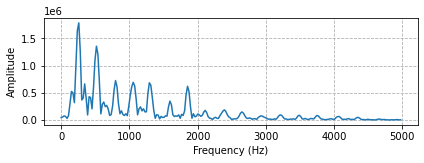

301.46484375


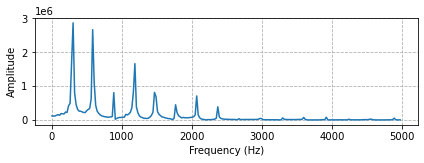

322.998046875


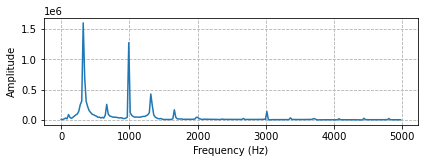

1055.126953125


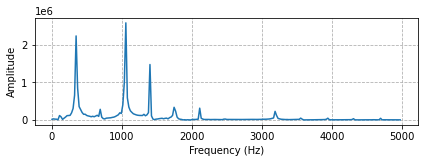

387.59765625


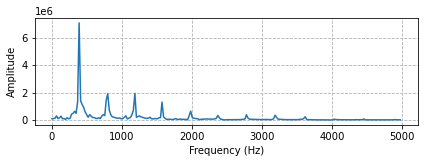

430.6640625


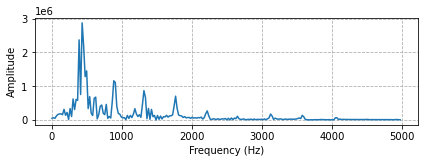

495.263671875


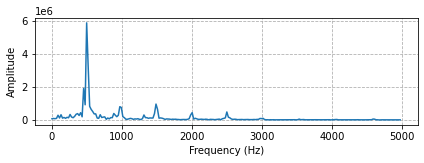

516.796875


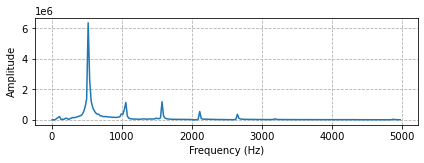

495.263671875


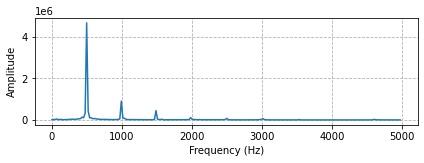

430.6640625


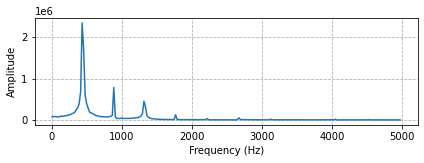

1055.126953125


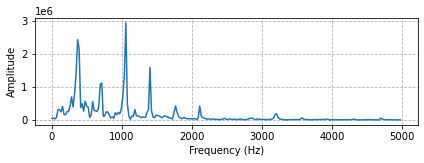

322.998046875


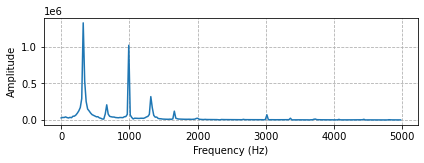

258.3984375


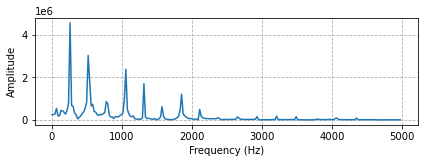

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pyaudio
import wave
import time
%matplotlib inline

file='C-major.wav'
time.sleep(1)
wf = wave.open(file, 'rb')

CHUNK_low = np.zeros(30)
CHUNK_high = np.ones(30)*1024*2
CHUNK = 1024*2

# instantiate PyAudio 
p = pyaudio.PyAudio()

# open stream audio 
stream = p.open(format=p.get_format_from_width(wf.getsampwidth()),
                channels=wf.getnchannels(),
                rate=wf.getframerate(),
                output=True)

#Set sampling time (s) = 1/sample rate (Hz)
sample_time=1./wf.getframerate()

#Create an empty array of the frequencies with the maximum amplitude
maxim = np.zeros(30)



#Iterate through the chunks
for i in range(1,30):
    try:
        CHUNK_low[i] = CHUNK_low[i-1] + CHUNK
        CHUNK_high[i] = CHUNK_high[i-1] + CHUNK
    
        F_CHUNK= int(CHUNK/2)+1
        t = np.arange(CHUNK_low[i], CHUNK_high[i], 1)
        t_real=t*sample_time
        t_len= CHUNK
        f_len= int(t_len/2)+1
        f = np.arange(0, F_CHUNK, 1)
        f_real=f/(sample_time*CHUNK)
        f_max=int(5000*f_len/f_real[f_len-1])#calculate index for 5000Hz
    
        data = wf.readframes(int(CHUNK_high[i]))    # read a CHUNK of data from file
        stream.write(data)       #stream a CHUNK of data to the player
        numpydata = np.frombuffer(data, dtype=np.int16) #convert to numpy array

        signal=numpydata[0:int(2*CHUNK):2]+numpydata[1:int(2*CHUNK):2]

        freq=np.fft.rfft(signal) #Do the FFT

        #Grab the maximum and plot the amplitude v.s frequency
        for j in range(1,np.size(np.absolute(freq[:f_max]))):
            if np.absolute(freq[:f_max])[j] == max(np.absolute(freq[:f_max])):
                maxim[i] = j/(sample_time*t_len)
                #Make sure you are not repeating the same note!
                if maxim[i] != maxim[i-1]:
                    plt.subplot(212)
                    plt.plot(f_real[:f_max],np.absolute(freq[:f_max]))
                    plt.grid(linestyle='--')
                    plt.xlabel('Frequency (Hz)')
                    plt.ylabel('Amplitude')
                    plt.tight_layout()
                    print(j/(sample_time*t_len))
        plt.show()
    except:
        pass


This is the same thing as above, but without the plots and more selection rules to create the array of notes in the scale.

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pyaudio
import wave
import time
%matplotlib inline

file='C-major.wav'
time.sleep(1)
wf = wave.open(file, 'rb')

CHUNK_low = np.zeros(30)
CHUNK_high = np.ones(30)*1024*2
CHUNK = 1024*2

# instantiate PyAudio 
p = pyaudio.PyAudio()

# open stream audio 
stream = p.open(format=p.get_format_from_width(wf.getsampwidth()),
                channels=wf.getnchannels(),
                rate=wf.getframerate(),
                output=True)

#Set sampling time (s) = 1/sample rate (Hz)
sample_time=1./wf.getframerate()

note = np.zeros(35)
scale_notes_unfiltered = np.zeros(30)

for i in range(1,35):
    try:
        CHUNK_low[i] = CHUNK_low[i-1] + CHUNK
        CHUNK_high[i] = CHUNK_high[i-1] + CHUNK
    
        F_CHUNK= int(CHUNK/2)+1
        t = np.arange(CHUNK_low[i], CHUNK_high[i], 1)
        t_real=t*sample_time
        t_len= CHUNK
        f_len= int(t_len/2)+1
        f = np.arange(0, F_CHUNK, 1)
        f_real=f/(sample_time*CHUNK)
        f_max=int(4000*f_len/f_real[f_len-1])#calculate index for 5000Hz
    
        data = wf.readframes(int(CHUNK_high[i]))    # read a CHUNK of data from file
        stream.write(data)       #stream a CHUNK of data to the player
        numpydata = np.frombuffer(data, dtype=np.int16) #convert to numpy array

        signal=numpydata[0:int(2*CHUNK):2]+numpydata[1:int(2*CHUNK):2]
    
        freq=np.fft.rfft(signal)
        
        y_axis = np.absolute(freq[:f_max])
        
        for j in range(1,np.size(y_axis)):
            if y_axis[j] == y_axis[0:int(np.size(y_axis)/5)].max(): #In the first few, there were some repeats. I can't figure out why, but I am filtering most of them out here.
                note[i] = j/(sample_time*t_len)
                if note[i] != note[i-1]:
                    scale_notes_unfiltered[i]=j/(sample_time*t_len)
                    print(j/(sample_time*t_len))
    except:
        pass
scale_notes=scale_notes_unfiltered[scale_notes_unfiltered!=0]


258.3984375
301.46484375
322.998046875
344.53125
387.59765625
430.6640625
495.263671875
516.796875
495.263671875
430.6640625
366.064453125
322.998046875
258.3984375


 Play the scale.

In [3]:
import IPython.display as ipd
ipd.Audio('C-major.wav')

Take the array of notes that was determined by slicing the file into chunks, and play that in an artificial format.

In [4]:
import numpy as np
sr = 22050 # sample rate
T = 8.0    # seconds
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
scale_notes = [258.3984375, 301.46484375, 322.998046875, 344.53125, 387.59765625, 430.6640625, 473.73046875, 516.796875, 473.73046875, 430.6640625, 387.59765625, 344.53125, 322.998046875, 301.46484375, 258.3984375]

play_notes = np.zeros((16,int(np.size(t)/16)))
y = np.zeros(np.size(t))

#for each frequency in the array, play the note of that frequency for T/16 seconds
for j in range(0,15):
    dt = np.linspace(j*T/16, (j+1)*T/16, int(T*sr/16), endpoint=False)
    play_notes[j,:] = 0.5*np.sin(2*np.pi*scale_notes[j]*dt)
    for i in range(0,np.size(dt)):
        k = i + int(j*np.size(dt))
        y[k] = play_notes[j,i]
        
ipd.Audio(y, rate=sr)

I looked up online what the frequencies of each note should be, and I used the same artificial format to construct a perfectly tuned scale.

In [5]:
import numpy as np
sr = 22050 # sample rate
T = 8.0    # seconds
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
expected_freq = [261.6, 293.7, 329.7,349.2, 392, 440, 493, 523.3, 493, 440, 392, 349.2, 329.7, 293.7, 261.6]

expected_notes = np.zeros((16,int(np.size(t)/16)))
x = np.zeros(np.size(t))
for j in range(0,15):
    dt = np.linspace(j*T/16, (j+1)*T/16, int(T*sr/16), endpoint=False)
    expected_notes[j,:] = 0.5*np.sin(2*np.pi*expected_freq[j]*dt)
    for i in range(0,np.size(dt)):
        k = i + int(j*np.size(dt))
        x[k] = expected_notes[j,i]
        
ipd.Audio(x, rate=sr)# load a NumPy array

Part 2

In this part, I am going to play the file and identify the indiviual notes that are played. Then, I will construct an artificial version of the file.

In [7]:
import IPython.display as ipd
ipd.Audio('chomj.wav')

258.3984375


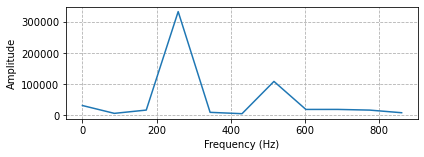

258.3984375


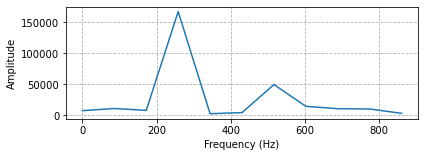

344.53125


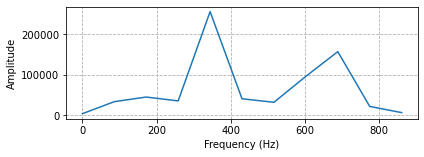

430.6640625


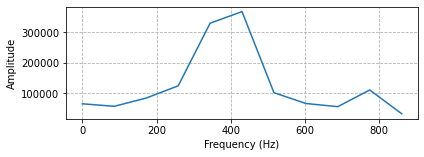

258.3984375


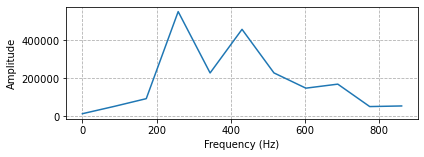

258.3984375


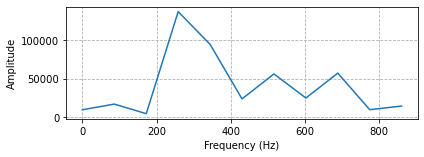

258.3984375


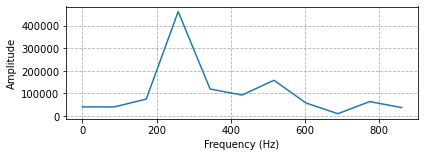

258.3984375


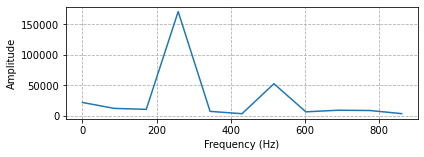

344.53125


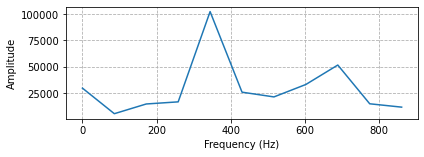

430.6640625


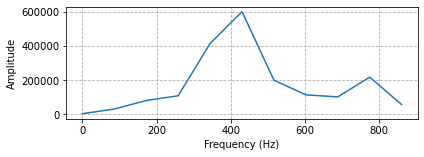

344.53125


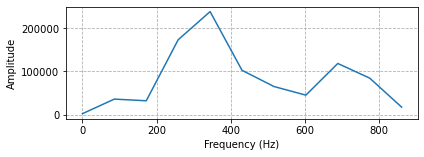

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pyaudio
import wave
import time
%matplotlib inline

file='chomj.wav'
time.sleep(1)
wf = wave.open(file, 'rb')

CHUNK_low = np.zeros(200)
CHUNK_high = np.ones(200)*1024*.5
CHUNK = 1024*.5


t_min=0.0
t_max=10.0
t_len = 4096*2
t=np.linspace(t_min,t_max,t_len)
sample_time = (t_max-t_min)/t_len #sampling time Delta_T per sample [s]


# instantiate PyAudio 
p = pyaudio.PyAudio()

# open stream audio 
stream = p.open(format=p.get_format_from_width(wf.getsampwidth()),
                channels=wf.getnchannels(),
                rate=wf.getframerate(),
                output=True)

#Set sampling time (s) = 1/sample rate (Hz)
sample_time=1./wf.getframerate()

for i in range(1,200):
    try:
        CHUNK_low[i] = CHUNK_low[i-1] + CHUNK
        CHUNK_high[i] = CHUNK_high[i-1] + CHUNK
    
        F_CHUNK= int(CHUNK/2)+1
        t = np.arange(CHUNK_low[i], CHUNK_high[i], 1)
        t_real=t*sample_time
        t_len= CHUNK
        f_len= int(t_len/2)+1
        f = np.arange(0, F_CHUNK, 1)
        f_real=f/(sample_time*CHUNK)

        data = wf.readframes(int(CHUNK_high[i]))    # read a CHUNK of data from file
        stream.write(data)       #stream a CHUNK of data to the player
        numpydata = np.frombuffer(data, dtype=np.int16) #convert to numpy array

        signal=numpydata[0:int(2*CHUNK):2]+numpydata[1:int(2*CHUNK):2]

        freq=np.fft.rfft(signal)


        if max(np.absolute(freq[:f_max])) > 100000:
            plt.subplot(212)
            freq=np.fft.rfft(signal)  #Perform FFT on waveform
            f_max=int(1000*f_len/f_real[f_len-1])#calculate index for 1000Hz
            plt.plot(f_real[:f_max],np.absolute(freq[:f_max]))
            plt.grid(linestyle='--')
            plt.xlabel('Frequency (Hz)')
            plt.ylabel('Amplitude')
            plt.tight_layout()
            for j in range(1,np.size(np.absolute(freq[:f_max]))):
                if np.absolute(freq[:f_max])[j] == max(np.absolute(freq[:f_max])):
                    print(j/(sample_time*t_len))
        plt.show()
    except:
        pass

From inspection, I found the frequencies of the three notes that are played individually and then make up the chord.

In [7]:
sr = 22050
T = 6.0
t = np.linspace(0, T, int(T*sr), endpoint=False)
expected_freq = [0, 0, 258.3984375, 344.53125, 430.6640625, 0]

expected_notes = np.zeros((8,int(np.size(t)/7)))
x = np.zeros(int(7*np.size(t)/6))

#the same loop as before but with an extra step to add the chord at the end.
for j in range(0,7):
    if j < 6:
        dt=np.linspace(j*T/7, (j+1)*T/7, int(T*sr/7), endpoint=False)
        expected_notes[j,:] = 0.5*np.sin(2*np.pi*expected_freq[j]*dt)
        for i in range(0,np.size(dt)):
            k = i + int(j*np.size(dt))
            x[k] = expected_notes[j,i]
    else:
        dt=np.linspace(j*T/7, (j+1)*T/7, int(T*sr/7), endpoint=False)
        expected_notes[j,:] = 0.5*np.sin(2*np.pi*expected_freq[2]*dt)+0.5*np.sin(2*np.pi*expected_freq[3]*dt)+0.5*np.sin(2*np.pi*expected_freq[4]*dt)
        for i in range(0,np.size(dt)):
            k = i + int(j*np.size(dt))
            x[k] = expected_notes[j,i]
        
ipd.Audio(x, rate=sr)# load a NumPy array

Part 3

In [10]:
import IPython.display as ipd
ipd.Audio('C major.wav')

322.998046875


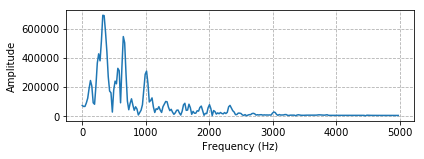

322.998046875


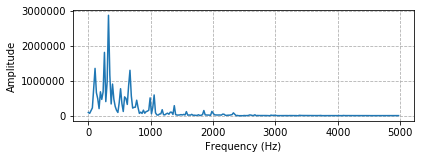

322.998046875


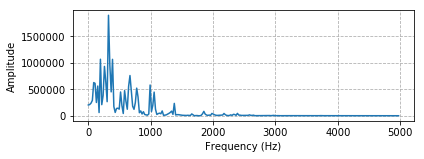

322.998046875


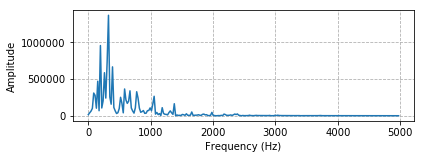

322.998046875


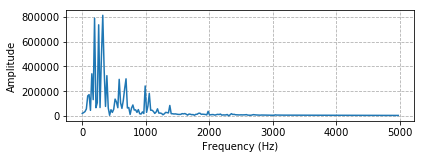

193.798828125


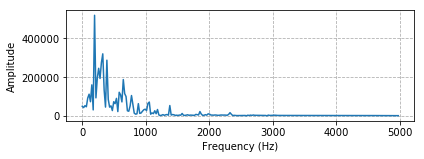

301.46484375


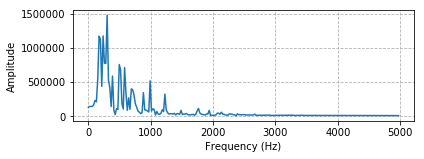

344.53125


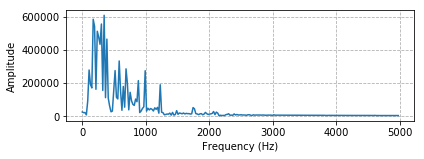

387.59765625


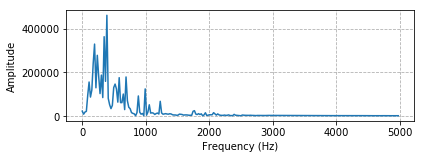

129.19921875


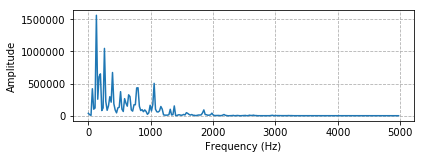

129.19921875


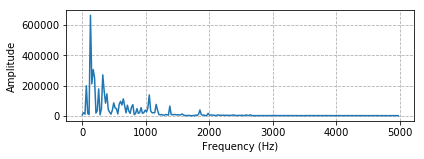

258.3984375


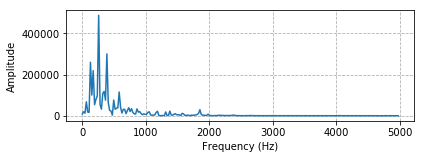

129.19921875


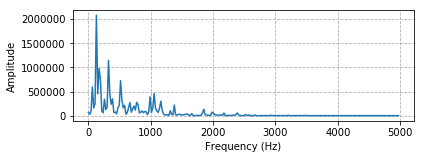

129.19921875


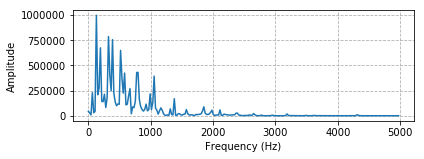

129.19921875


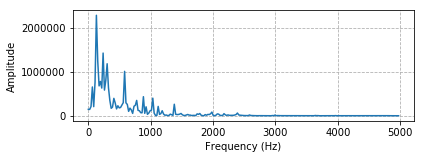

322.998046875


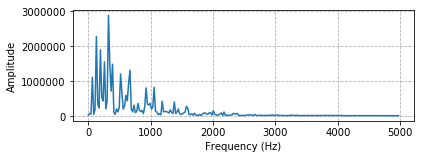

322.998046875


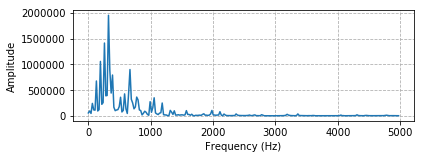

495.263671875


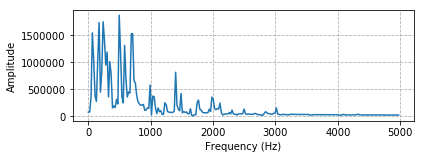

86.1328125


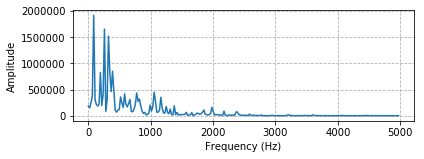

258.3984375


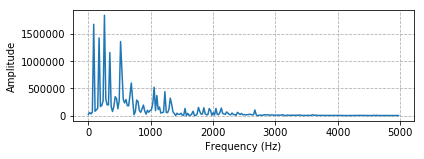

64.599609375


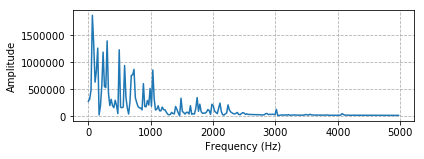

258.3984375


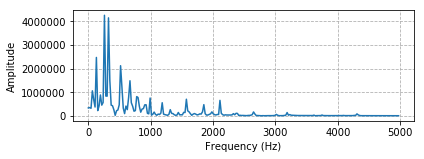

667.529296875


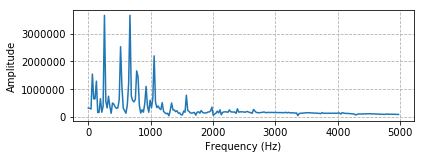

495.263671875


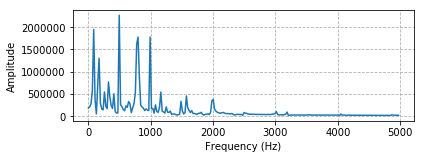

882.861328125


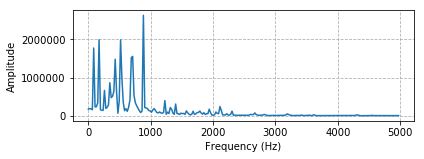

172.265625


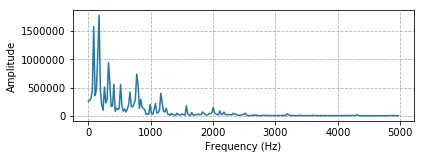

301.46484375


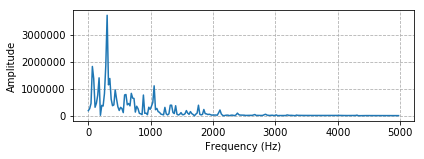

193.798828125


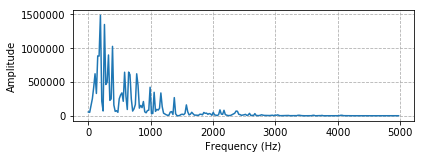

301.46484375


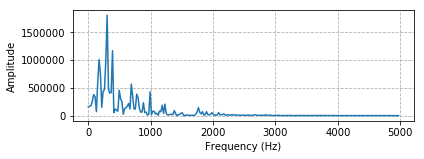

258.3984375


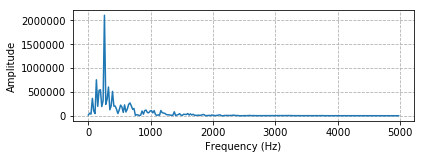

322.998046875


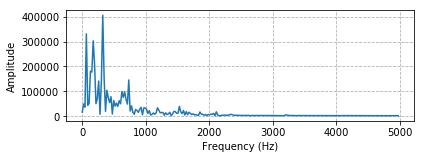

In [44]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pyaudio
import wave
import time
%matplotlib inline

file='C major.wav'
time.sleep(1)
wf = wave.open(file, 'rb')

CHUNK_low = np.zeros(350)
CHUNK_high = np.ones(350)*int(1024)
CHUNK = int(1024)


t_min=0.0
t_max=10.0
t_len = 4096*2
t=np.linspace(t_min,t_max,t_len)
sample_time = (t_max-t_min)/t_len #sampling time Delta_T per sample [s]


# instantiate PyAudio 
p = pyaudio.PyAudio()

# open stream audio 
stream = p.open(format=p.get_format_from_width(wf.getsampwidth()),
                channels=wf.getnchannels(),
                rate=wf.getframerate(),
                output=True)

#Set sampling time (s) = 1/sample rate (Hz)
sample_time=1./wf.getframerate()

for i in range(1,350):
    try:
        CHUNK_low[i] = CHUNK_low[i-1] + CHUNK
        CHUNK_high[i] = CHUNK_high[i-1] + CHUNK
    
        F_CHUNK= int(CHUNK/2)+1
        t = np.arange(CHUNK_low[i], CHUNK_high[i], 1)
        t_real=t*sample_time
        t_len= CHUNK
        f_len= int(t_len/2)+1
        f = np.arange(0, F_CHUNK, 1)
        f_real=f/(sample_time*CHUNK)

        data = wf.readframes(int(CHUNK_high[i]))    # read a CHUNK of data from file
        stream.write(data)       #stream a CHUNK of data to the player
        numpydata = np.frombuffer(data, dtype=np.int16) #convert to numpy array

        signal=numpydata[0:int(2*CHUNK):2]+numpydata[1:int(2*CHUNK):2]

        freq=np.fft.rfft(signal)


        if max(np.absolute(freq[:f_max])) > 100000:
            plt.subplot(212)
            freq=np.fft.rfft(signal)  #Perform FFT on waveform
            f_max=int(5000*f_len/f_real[f_len-1])#calculate index for 1000Hz
            plt.plot(f_real[:f_max],np.absolute(freq[:f_max]))
            plt.grid(linestyle='--')
            plt.xlabel('Frequency (Hz)')
            plt.ylabel('Amplitude')
            plt.tight_layout()
            for j in range(1,np.size(np.absolute(freq[:f_max]))):
                if np.absolute(freq[:f_max])[j] == max(np.absolute(freq[:f_max])):
                    print(j/(sample_time*t_len))
        plt.show()
    except:
        pass

I anticipated that the root note of the chord would be the loudest note for each chord. As can be seen in the plots above, this is not the case. I cannot construct an array of notes based off of this file using this method.